In [1]:
import mne
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
from pathlib import Path
import pandas as pd

from sklearn.neighbors import KernelDensity

from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import ccf

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as grid_spec

from ica_benchmark.io.load import BCI_IV_Comp_Dataset
from ica_benchmark.processing.ica import get_ica_instance, get_all_methods

%matplotlib inline

# pip install PyQt5
# matplotlib.use("Qt5Agg")
# %matplotlib notebook

In [2]:
def cue_name(cue):
    return {
        0: "Left hand",
        1: "Right hand",
        2: "Foot",
        3: "Tongue",
    }[cue]

# Loading data

In [3]:
root = Path("/home/paulo/Documents/datasets/BCI_Comp_IV_2a/gdf/")

subject_number = 1

filepaths = [
    root / "A{}T.gdf".format(str(subject_number).rjust(2, "0"))
]

print("Loading imagery epochs")
full_epochs = BCI_IV_Comp_Dataset.load_dataset(
    filepaths,
    as_epochs=True,
    concatenate=False,
    drop_bad=True,
    return_metadata=False,
    tmin=-2.,
    tmax=6.,
)[0]


print("Loading imagery raw")
raw = BCI_IV_Comp_Dataset.load_as_raw(filepaths[0])

Loading imagery epochs
Loading imagery raw


In [4]:
L_FREQ, H_FREQ = (None, 40)
RE_FS = 100
baseline_period = (-2, 0)
# epochs = epochs.filter(l_freq=L_FREQ, h_freq=H_FREQ).resample(RE_FS);
# raw = raw.filter(l_freq=L_FREQ, h_freq=H_FREQ).resample(RE_FS);

# Documentation says that `resample` method applies a anti-aliasing filter.
# https://mne.tools/dev/overview/faq.html#resampling-and-decimating


# full_epochs.load_data().apply_baseline(baseline_period).resample(RE_FS);
full_epochs.load_data()

full_epochs.resample(RE_FS);

# If data is not loaded source_full_epochs wont know the right number 
# of epochs because bad epochs will not be dropped yet
imagery_epochs = full_epochs.copy().crop(3, 6).load_data()
raw.load_data().resample(RE_FS);

# CAR
full_epochs.set_eeg_reference("average");
raw.set_eeg_reference("average");
ch_names = imagery_epochs.ch_names

In [5]:
full_epochs

Number of events,160
Events,0: 451: 452: 363: 34
Time range,-2.000 – 5.990 sec
Baseline,off


In [6]:
imagery_epochs

Number of events,160
Events,0: 451: 452: 363: 34
Time range,3.000 – 5.990 sec
Baseline,off


In [7]:
ICA = get_ica_instance("ext_infomax", n_components=len(ch_names))
ICA.fit(imagery_epochs)

imagery_source_epochs = ICA.get_sources(imagery_epochs)
full_source_epochs = ICA.get_sources(full_epochs)

ica_channels = imagery_source_epochs.ch_names


In [8]:
# Needed for TFR calculations (dont know why)
# full_source_epochs.set_channel_types(
#     {
#         channel: "eeg"
#         for channel in ica_channels
#     }
# )

def retype_ica_channels(epochs):
    return epochs.copy().set_channel_types(
        {
            channel: "eeg"
            for channel in epochs.ch_names
        }
    )


In [9]:
imagery_source_epochs

Number of events,160
Events,0: 451: 452: 363: 34
Time range,3.000 – 5.990 sec
Baseline,off


In [10]:
full_source_epochs

Number of events,160
Events,0: 451: 452: 363: 34
Time range,-2.000 – 5.990 sec
Baseline,off


In [11]:
epochs_cues = imagery_epochs.events[:, 2]
cues = np.unique(epochs_cues)
cues_epochs_dict = {
    cue: epochs_cues == cue
    for cue
    in cues
}
list(cues_epochs_dict.keys())

[0, 1, 2, 3]

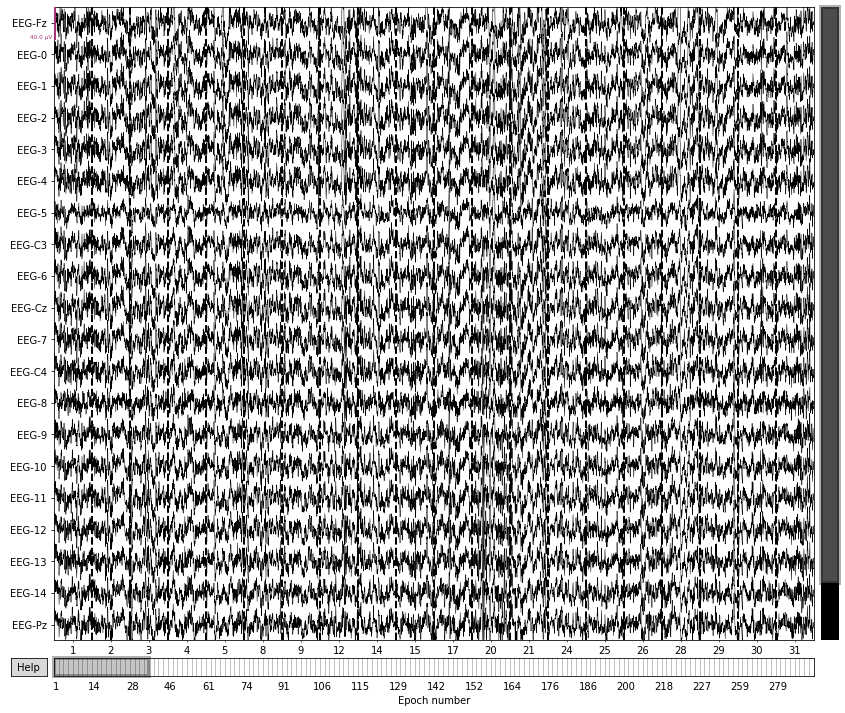

In [12]:
imagery_epochs.plot();

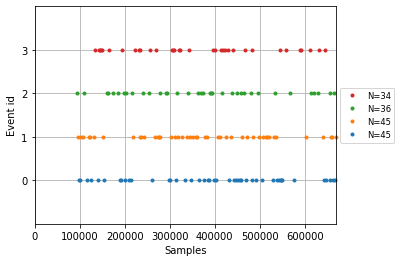

In [13]:
mne.viz.plot_events(imagery_epochs.events);

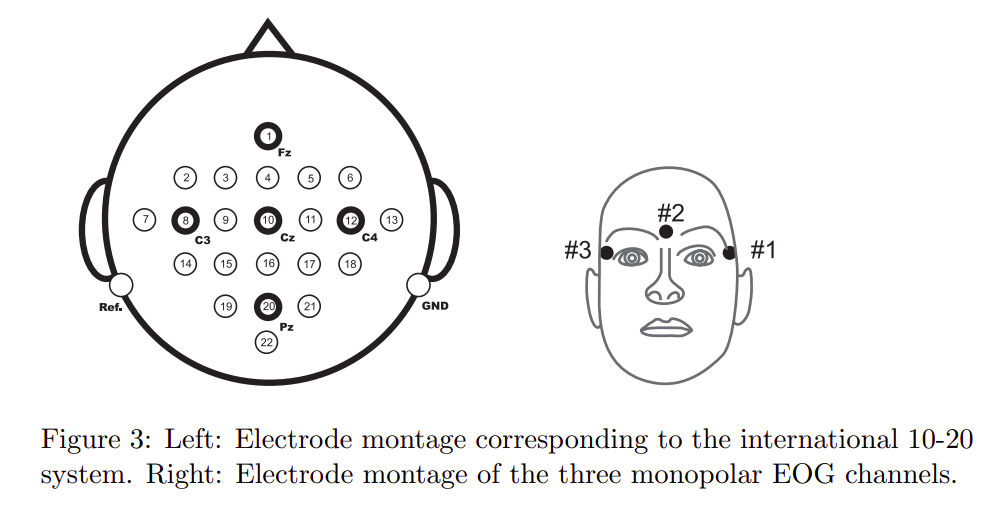

In [14]:
def multi_trial_acf(x, nlags=100):
    autocorr_sequence_list = list()
    for trial_number in range(len(x)):
        autocorr_sequence_list.append(
            acf(x[trial_number], nlags=nlags)
        )
    autocorr_sequences = np.array(autocorr_sequence_list)
    return autocorr_sequences

## Average auto-correlation sequence between all trials 

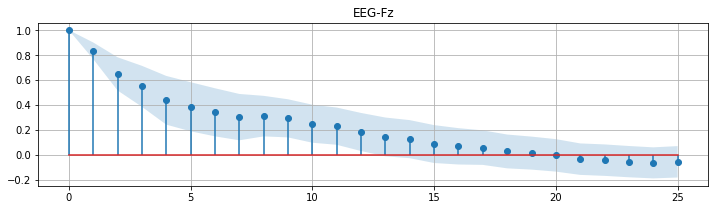

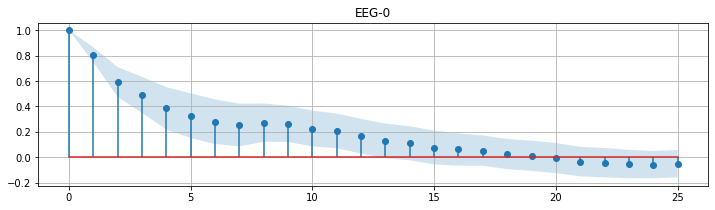

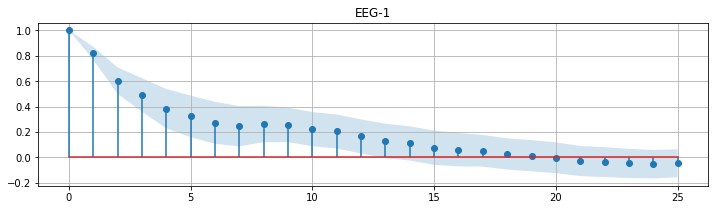

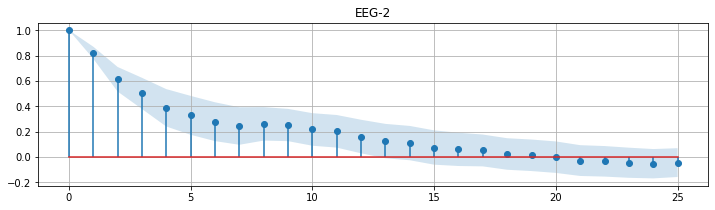

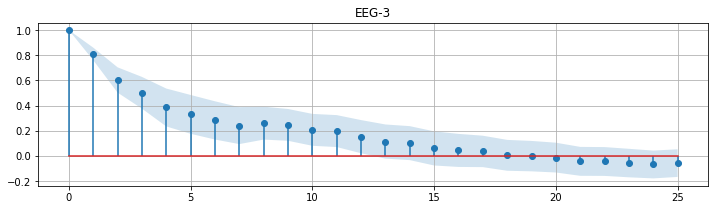

...

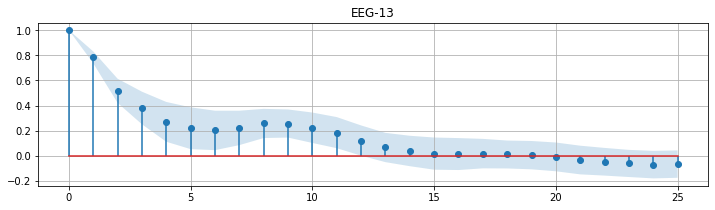

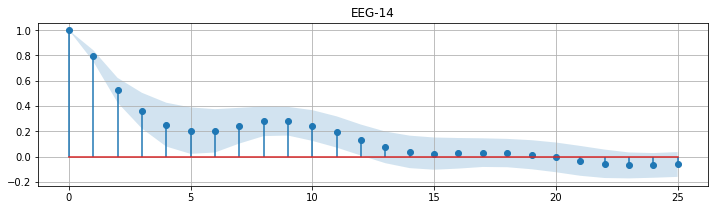

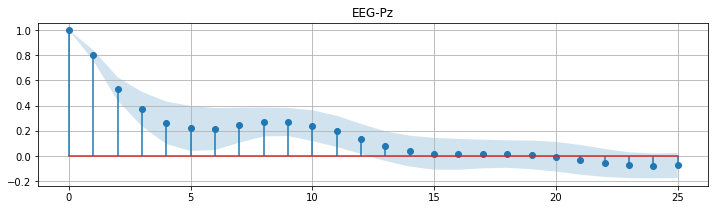

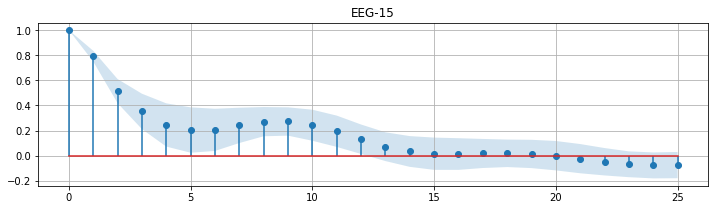

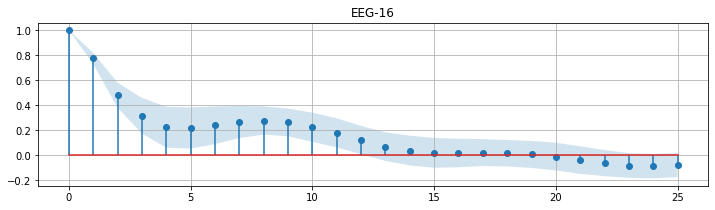

In [15]:
for channel in ch_names:
    channel_data = imagery_epochs.copy().pick(channel).get_data().squeeze()
    plt.figure(figsize=(12, 3))
    ac_sequences = multi_trial_acf(channel_data, nlags=25)
    ac_avg = ac_sequences.mean(axis=0)
    ac_err = ac_sequences.std(axis=0)
    plt.stem(ac_avg)
    plt.fill_between(
        range(len(ac_avg)), ac_avg - ac_err, ac_avg + ac_err,
        alpha=.2
    )
    plt.grid()
    plt.title(channel)
    plt.show()
    

In [16]:
selected_channels = ["EEG-Fz", "EEG-C3", "EEG-C4", "EEG-Pz", "EEG-Cz"]

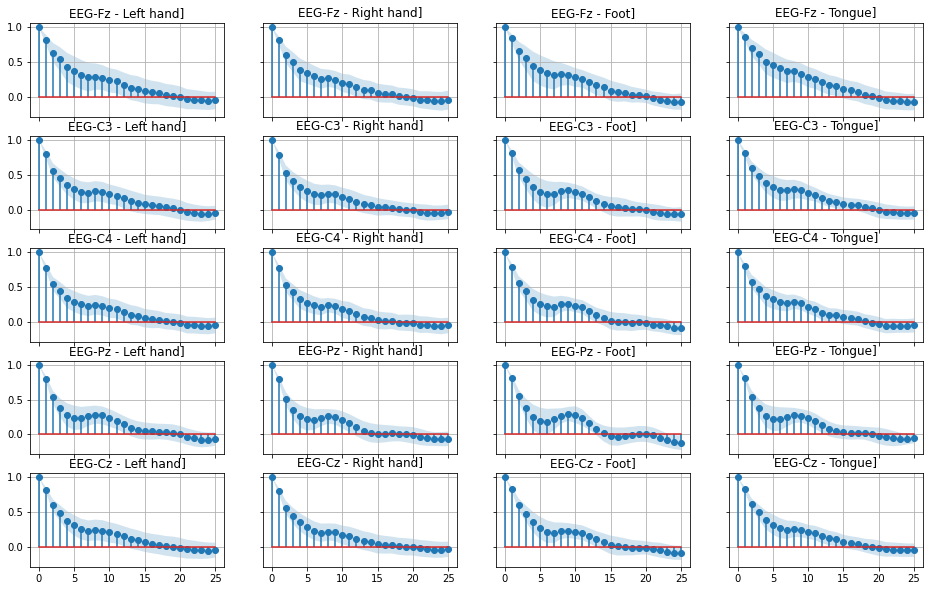

In [17]:
nrows, ncols = len(selected_channels), len(cues), 
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 2), sharey=True, sharex=True)
for col, cue in enumerate(cues):
    for row, channel in enumerate(selected_channels):
        ax = axes[row, col]
        channel_data = imagery_epochs.copy().pick(channel).drop(~cues_epochs_dict[cue]).get_data().squeeze()
        ac_sequences = multi_trial_acf(channel_data, nlags=25)
        ac_avg = ac_sequences.mean(axis=0)
        ac_err = ac_sequences.std(axis=0)
        ax.stem(ac_avg)
        ax.fill_between(
            range(len(ac_avg)), ac_avg - ac_err, ac_avg + ac_err,
            alpha=.2
        )
        ax.grid()
        ax.set_title(f"{channel} - {cue_name(cue)}]")
plt.show()

# Independent Component Analysis

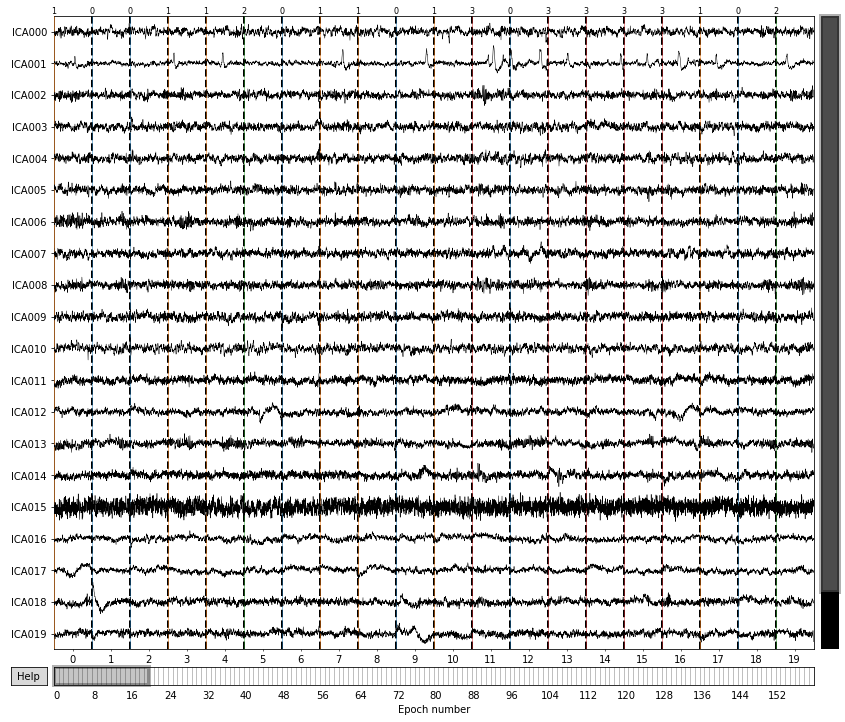

In [18]:
mne.viz.plot_ica_sources(ICA, imagery_epochs);

## ICA - Autocorrelation sequence

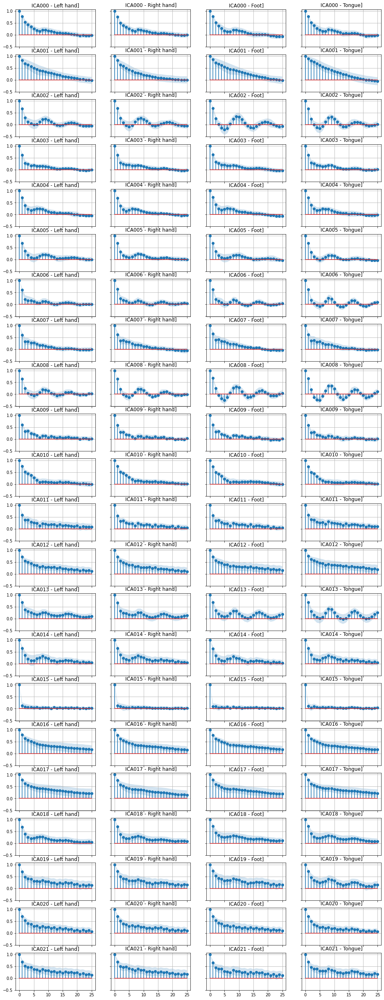

In [19]:
nrows, ncols = len(ica_channels), len(cues), 
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 2), sharey=True, sharex=True)
for col, cue in enumerate(cues):
    for row, channel in enumerate(ica_channels):
        ax = axes[row, col]
        channel_data = imagery_source_epochs.copy().pick(channel).drop(~cues_epochs_dict[cue]).get_data().squeeze()
        ac_sequences = multi_trial_acf(channel_data, nlags=25)
        ac_avg = ac_sequences.mean(axis=0)
        ac_err = ac_sequences.std(axis=0)
        ax.stem(ac_avg)
        ax.fill_between(
            range(len(ac_avg)), ac_avg - ac_err, ac_avg + ac_err,
            alpha=.2
        )
        ax.grid()
        ax.set_title(f"{channel} - {cue_name(cue)}]")
plt.show()

# Power Spectral Density
## Sensor Space

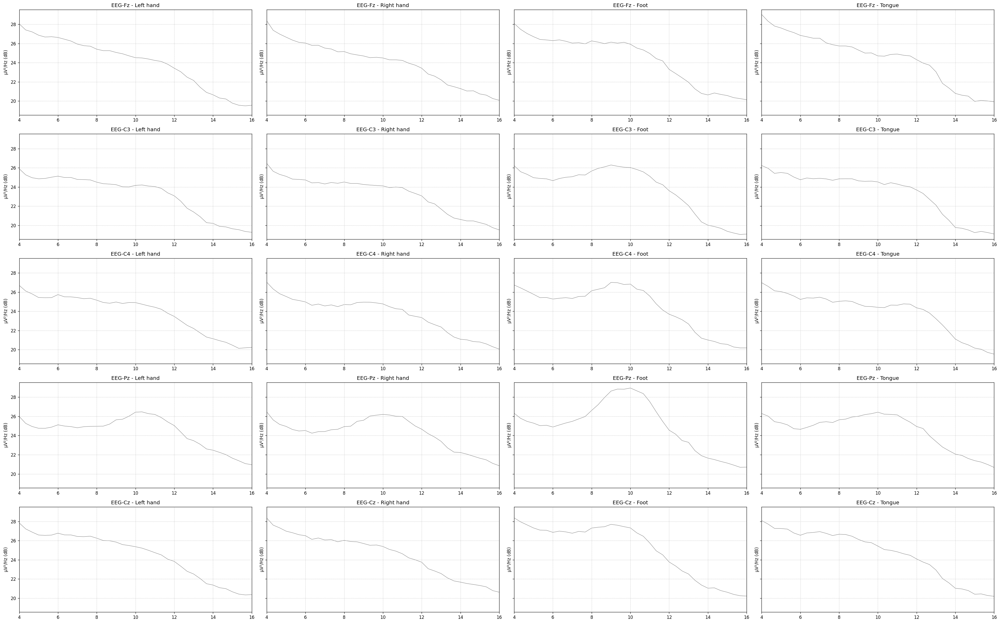

In [20]:
nrows, ncols = len(selected_channels), len(cues)
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 8, nrows * 4), sharey=True, sharex=False, dpi=120)
for col, cue in enumerate(cues):
    for row, channel in enumerate(selected_channels):
        ax = axes[row, col]
        (
            imagery_epochs 
                .copy()
                .pick(channel)
                .drop(~cues_epochs_dict[cue])
                .plot_psd(fmin=4, fmax=16, ax=ax, show=False)
        )
        ax.set_title(f"{channel} - {cue_name(cue)}")

plt.tight_layout()
plt.show()
plt.close(fig)

## Source Space

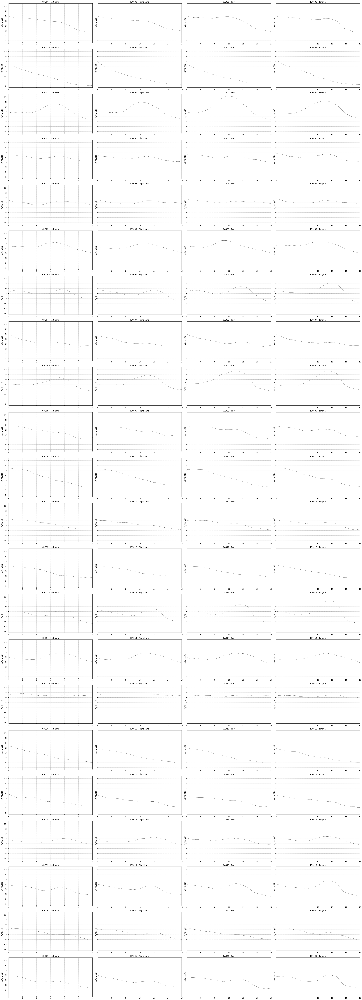

In [21]:
nrows, ncols = len(ica_channels), len(cues), 
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 8, nrows * 4), sharey=True, sharex=False, dpi=120)
for col, cue in enumerate(cues):
    for row, channel in enumerate(ica_channels):
        ax = axes[row, col]
        (
            imagery_source_epochs 
                .copy()
                .pick(channel)
                .drop(~cues_epochs_dict[cue])
                .plot_psd(fmin=4, fmax=16, ax=ax, show=False, picks="misc")
        )
        ax.set_title(f"{channel} - {cue_name(cue)}")
    
plt.tight_layout()
plt.show()
plt.close(fig)

# Time-Frequency estimation - Periodograms

## Sensor Space

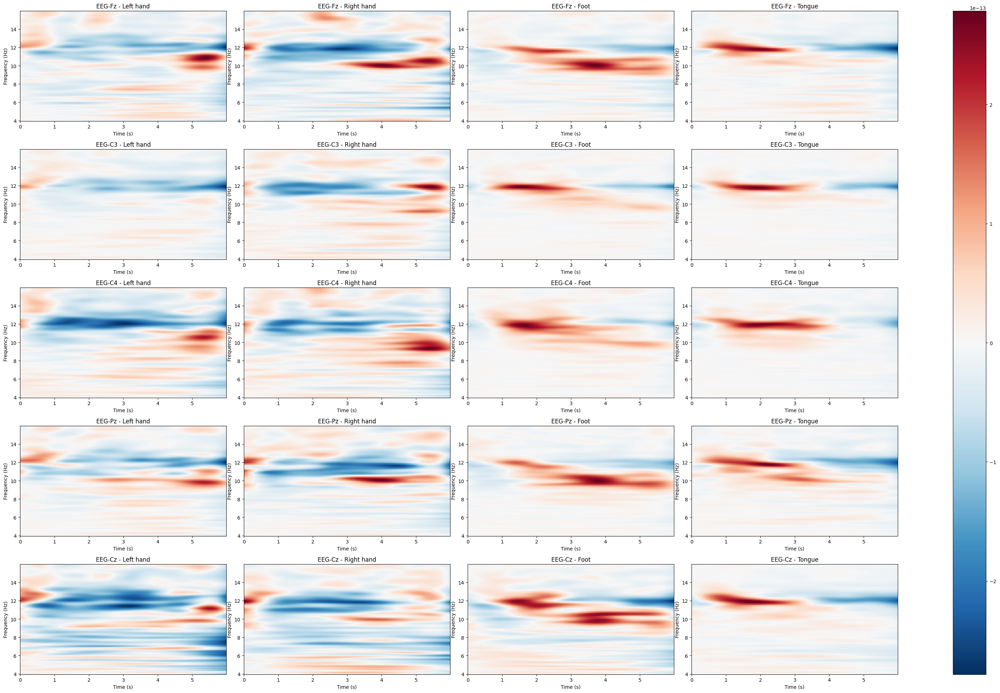

In [22]:
tfr_estimator = "stockwell"

lfreq, hfreq = 4, 16
freqs = np.linspace(lfreq, hfreq, (hfreq - lfreq) * 2 + 1)

nrows, ncols = len(selected_channels), len(cues), 
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 8, nrows * 4), sharey=False, sharex=False, dpi=100)
for col, cue in enumerate(cues):

    if tfr_estimator == "stockwell":
        power = mne.time_frequency.tfr_stockwell(
            full_epochs.copy().drop(~cues_epochs_dict[cue]),
            fmin=freqs[0],
            fmax=freqs[-1],
            n_jobs=3,
            width=.7 # The less, the less freq precision, the higher time precision
        )
    elif tfr_estimator == "morlet":
        time_smoothing_window = 1
        n_cycles = freqs * time_smoothing_window #

        power = mne.time_frequency.tfr_morlet(
            full_epochs.copy().drop(~cues_epochs_dict[cue]),
            freqs,
            n_cycles=n_cycles,
            n_jobs=3,
            return_itc=False
        )
    elif tfr_estimator == "multitaper":
        time_period_window = 1 # The higher, the less the frequency precision and the highter the time precision
        n_cycles = freqs * time_period_window # Time window is n_cycles / freqs
        # freq_smoothing_8hz = n_cycles[0] *
        time_bandwidth = 4.0  # Same time-smoothing as (1), 7 tapers.

        power = mne.time_frequency.tfr_multitaper(
            full_epochs.copy().drop(~cues_epochs_dict[cue]),
            time_bandwidth=time_bandwidth,
            freqs=freqs,
            n_cycles=n_cycles,
            n_jobs=3,
            return_itc=False,
            average=True
        )
    
    for row, channel in enumerate(selected_channels):

        ax = axes[row, col]
        im = power.plot(
            picks=channel,
            axes=ax,
            show=False,
            mode="mean",
            baseline=(-2, 2),
            tmin=0,
            tmax=6,
            colorbar=False,
        )
        ax.set_title(f"{channel} - {cue_name(cue)}")
        
fig.tight_layout()
im = ax.get_images()[0]
fig.colorbar(im, ax=axes.ravel().tolist())

plt.show()

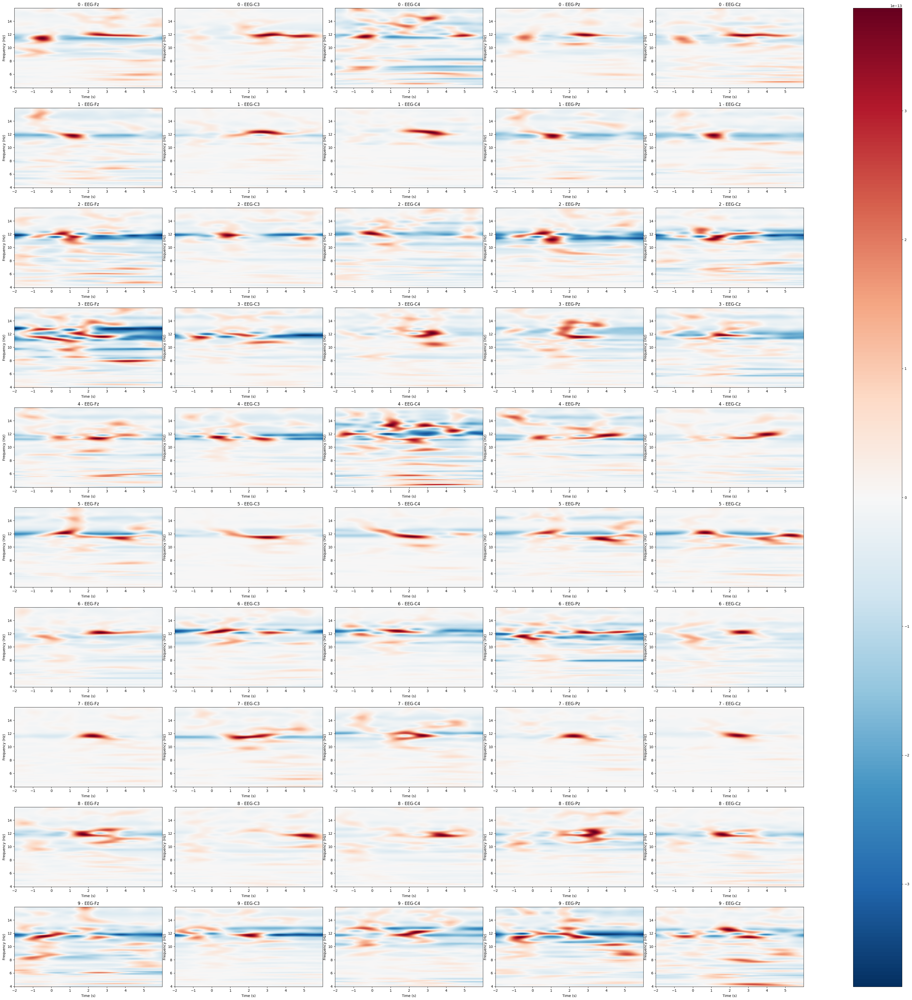

In [23]:
tfr_estimator = 'stockwell'
cue = 3
n_epochs = 10
nrows, ncols = n_epochs, len(selected_channels)
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 8, nrows * 4), sharey=False, sharex=False, dpi=100)

for row, epoch_idx in enumerate(range(n_epochs)):
    for col, channel in enumerate(selected_channels):
        e = full_epochs.copy().drop(~cues_epochs_dict[cue])[epoch_idx]

        if tfr_estimator == "stockwell":
            power = mne.time_frequency.tfr_stockwell(
                e,
                fmin=freqs[0],
                fmax=freqs[-1],
                n_jobs=3,
                width=.7 # The less, the less freq precision, the higher time precision
            )
        elif tfr_estimator == "morlet":
            time_smoothing_window = 1
            n_cycles = freqs * time_smoothing_window #

            power = mne.time_frequency.tfr_morlet(
                e,
                freqs,
                n_cycles=n_cycles,
                n_jobs=3,
                return_itc=False
            )
        elif tfr_estimator == "multitaper":
            time_period_window = 1 # The higher, the less the frequency precision and the highter the time precision
            n_cycles = freqs * time_period_window # Time window is n_cycles / freqs
            # freq_smoothing_8hz = n_cycles[0] *
            time_bandwidth = 4.0  # Same time-smoothing as (1), 7 tapers.

            power = mne.time_frequency.tfr_multitaper(
                e,
                time_bandwidth=time_bandwidth,
                freqs=freqs,
                n_cycles=n_cycles,
                n_jobs=3,
                return_itc=False,
                average=True
            )

        ax = axes[row, col]
        im = power.plot(
            picks=channel,
            axes=ax,
            show=False,
            mode="mean",
            baseline=(-2, 2),
            colorbar=False,
        )
        ax.set_title(f"{epoch_idx} - {channel}")
        
fig.tight_layout()
im = ax.get_images()[0]
fig.colorbar(im, ax=axes.ravel().tolist())

plt.show()

## Source Space

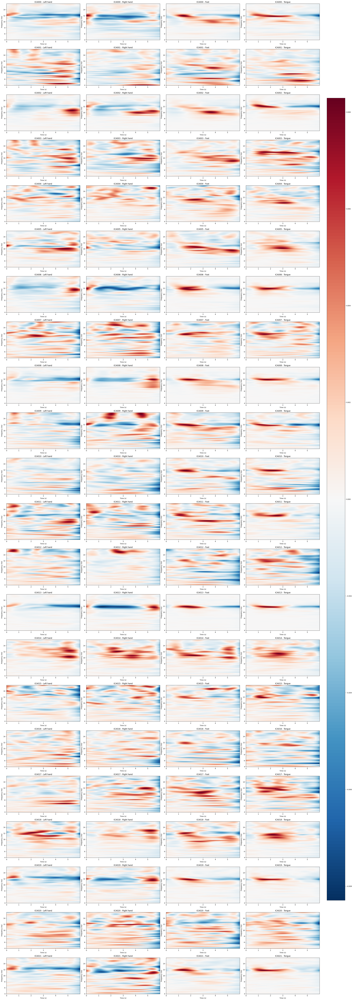

In [24]:
tfr_estimator = "stockwell"

lfreq, hfreq = 4, 16
freqs = np.linspace(lfreq, hfreq, (hfreq - lfreq) * 2 + 1)

nrows, ncols = len(ica_channels), len(cues), 
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 8, nrows * 4), sharey=False, sharex=False, dpi=100)

epochs = retype_ica_channels(full_source_epochs)

for col, cue in enumerate(cues):
    if tfr_estimator == "stockwell":
        power = mne.time_frequency.tfr_stockwell(
            epochs.copy().drop(~cues_epochs_dict[cue]),
            fmin=freqs[0],
            fmax=freqs[-1],
            n_jobs=3,
            width=.7,
        )
    elif tfr_estimator == "morlet":
        time_smoothing_window = 1 
        n_cycles = freqs * time_smoothing_window #

        power = mne.time_frequency.tfr_morlet(
            epochs.copy().drop(~cues_epochs_dict[cue]),
            freqs,
            n_cycles=n_cycles,
            n_jobs=3,
            return_itc=False,
        )
    elif tfr_estimator == "multitaper":
        time_period_window = .5
        n_cycles = freqs * time_period_window # Time window is n_cycles / freqs
        # freq_smoothing_8hz = n_cycles[0] *
        time_bandwidth = 4.0  # Same time-smoothing as (1), 7 tapers.

        power = mne.time_frequency.tfr_multitaper(
            epochs.copy().drop(~cues_epochs_dict[cue]),
            time_bandwidth=time_bandwidth,
            freqs=freqs,
            n_cycles=n_cycles,
            n_jobs=3,
            return_itc=False,
            average=True,
        )
    for row, channel in enumerate(ica_channels):
        ax = axes[row, col]
        im = power.plot(
            picks=channel,
            axes=ax,
            show=False,
            mode="mean",
            baseline=(-2, 2),
            tmin=0,
            tmax=6,
            colorbar=False
        )
        ax.set_title(f"{channel} - {cue_name(cue)}")

fig.tight_layout()
fig.subplots_adjust(right=0.88)
cbar_ax = fig.add_axes([0.9, 0.1, 0.05, 0.8])
im = ax.get_images()[0]
fig.colorbar(im, cax=cbar_ax)
plt.show()

# fig.tight_layout()
# im = ax.get_images()[0]
# fig.colorbar(im, ax=axes.ravel().tolist())
# plt.show()

<ipython-input-25-aa5d6a27b6f5>:58: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


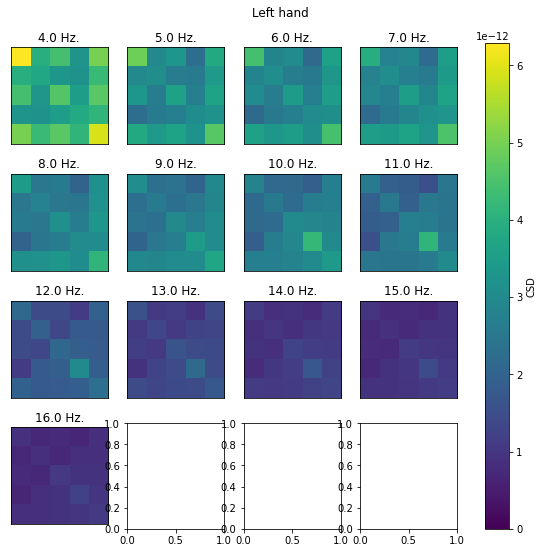

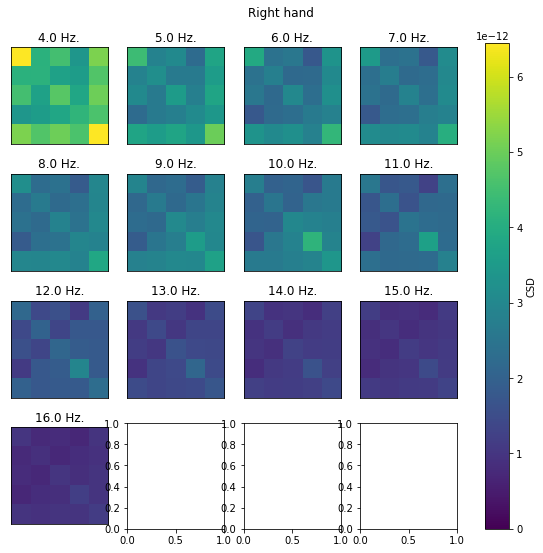

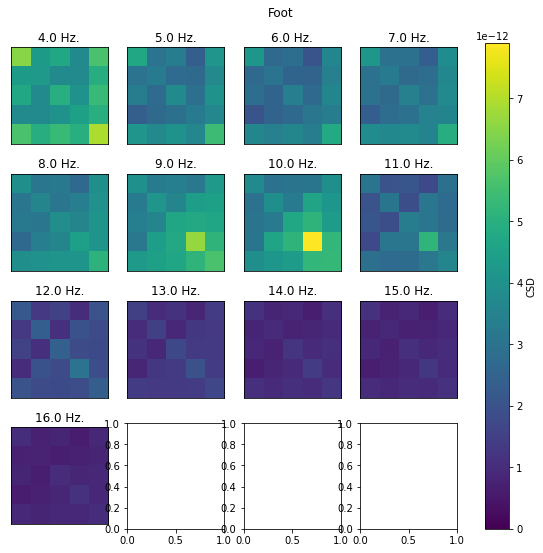

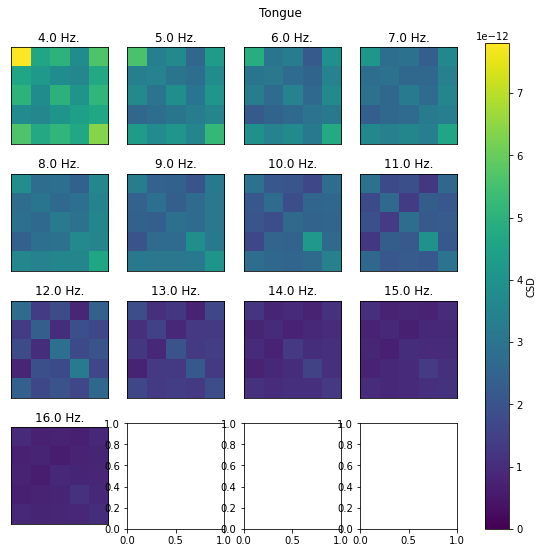

In [25]:
csd_method = "morlet"

FMIN = 4
FMAX = 16

csd_kwargs = dict(
    fmin=FMIN,
    fmax=FMAX,
    tmin=3,
    tmax=6,
)

freqs = np.linspace(FMIN, FMAX, (FMAX - FMIN) * 2 + 1)

for cue in cues:
    if csd_method == "multitaper":
        csd = mne.time_frequency.csd_multitaper(
            imagery_epochs.copy().drop(~cues_epochs_dict[cue]),
            picks=selected_channels,
            bandwidth=1,
            n_jobs=2,
            verbose=None,
            ** csd_kwargs
        )
        csd = csd[::3]
    elif csd_method == "fourier":
        csd = mne.time_frequency.csd_fourier(
            imagery_epochs.copy().drop(~cues_epochs_dict[cue]),
            picks=selected_channels,
            n_jobs=2,
            verbose=None,
            ** csd_kwargs
        )
        csd = csd[::3]
    elif csd_method == "morlet":
        time_smoothing_window = 1
        n_cycles = freqs * time_smoothing_window

        csd = mne.time_frequency.csd_morlet(
            imagery_epochs.copy().drop(~cues_epochs_dict[cue]),
            freqs,#16 - 6 + 1),
            picks=selected_channels,
            n_cycles=n_cycles,
            use_fft=True,
            projs=None,
            n_jobs=2,
            verbose=None
        )
    fig = csd[::2].plot(
        mode="csd",
        show=False
    )[0]
    fig.set_size_inches(10, 10)
    fig.suptitle(cue_name(cue), y=.85)
#     plt.clim((0, 1))
#     fig.axes[0].images[0].set_clim(0, 1)
#     fig.axes[0].set_xlim(-2)
    fig.show()

<ipython-input-26-c62c719aed7d>:58: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


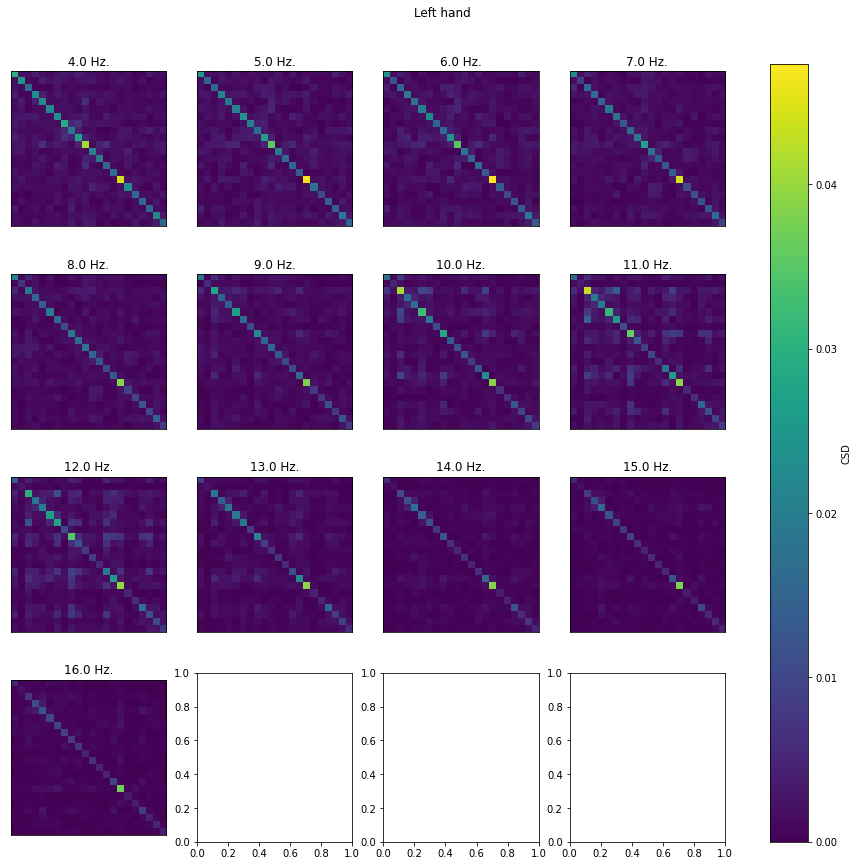

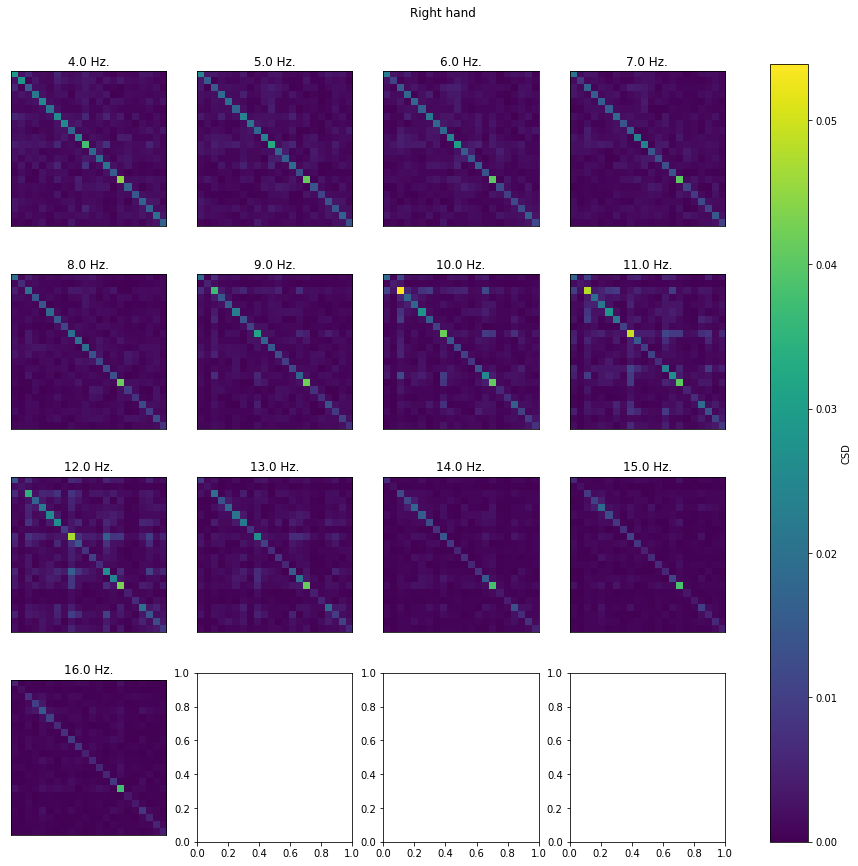

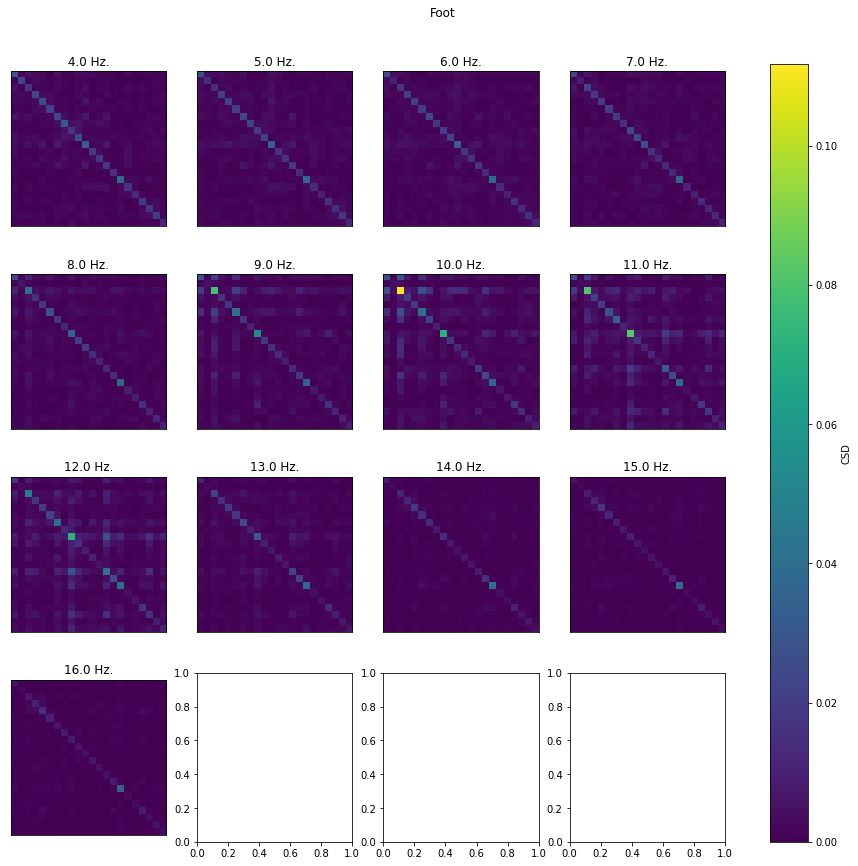

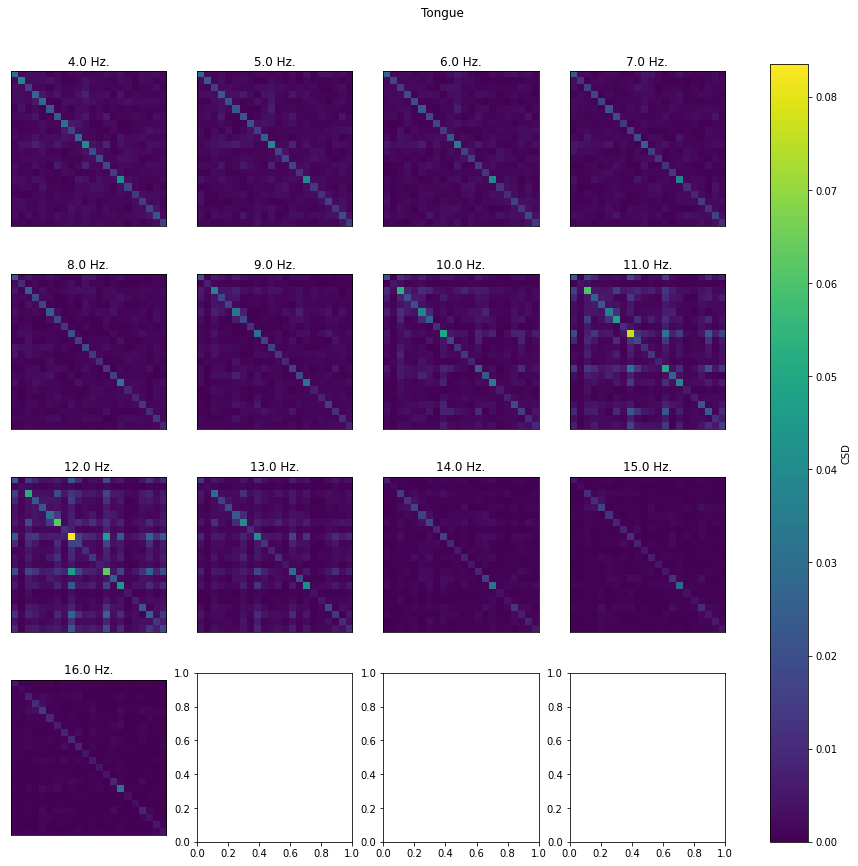

In [26]:
csd_method = "morlet"

FMIN = 4
FMAX = 16

csd_kwargs = dict(
    fmin=FMIN,
    fmax=FMAX,
    tmin=3,
    tmax=6,
)

freqs = np.linspace(FMIN, FMAX, (FMAX - FMIN) * 2 + 1)

for cue in cues:
    if csd_method == "multitaper":
        csd = mne.time_frequency.csd_multitaper(
            imagery_source_epochs.copy().drop(~cues_epochs_dict[cue]),
            picks=ica_channels,
            bandwidth=1,
            n_jobs=2,
            verbose=None,
            ** csd_kwargs
        )
        csd = csd[::3]
    elif csd_method == "fourier":
        csd = mne.time_frequency.csd_fourier(
            imagery_source_epochs.copy().drop(~cues_epochs_dict[cue]),
            picks=ica_channels,
            n_jobs=2,
            verbose=None,
            ** csd_kwargs
        )
        csd = csd[::3]
    elif csd_method == "morlet":
        time_smoothing_window = 1
        n_cycles = freqs * time_smoothing_window

        csd = mne.time_frequency.csd_morlet(
            imagery_source_epochs.copy().drop(~cues_epochs_dict[cue]),
            freqs,#16 - 6 + 1),
            picks=ica_channels,
            n_cycles=n_cycles,
            use_fft=True,
            projs=None,
            n_jobs=2,
            verbose=None
        )
    fig = csd[::2].plot(
        mode="csd",
        show=False
    )[0]
    fig.set_size_inches(16, 16)
    fig.suptitle(cue_name(cue), y=.85)
#     plt.clim((0, 1))
#     fig.axes[0].images[0].set_clim(0, 1)
#     fig.axes[0].set_xlim(-2)
    fig.show()

In [27]:

data = pd.read_csv("/home/paulo/Downloads/mock-european-test-results.csv")

colors = ['#0000ff', '#3300cc', '#660099', '#990066', '#cc0033', '#ff0000']




def plot_cue_stems(data_list, title="", title_list=None, orig_ax=None):
    if orig_ax is None:
        fig = plt.figure(figsize=(16, 9))
        gs = grid_spec.GridSpec(len(cues), 1)
    else:
        divider = make_axes_locatable(orig_ax)            
        
    for i, cue in enumerate(cues):
        if orig_ax is None:
            ax = fig.add_subplot(gs[i:i+1, 0:])
        else:
            if i == 0:
                ax = orig_ax
                ax.set_title(title)
            else:
                ax = divider.new_vertical(size="100%", pad=0.1, pack_start=True)
                orig_ax.get_figure().add_axes(ax)

        ax.stem(data_list[i])
        ax.set_ylim(-0.3, 1)

        rect = ax.patch
        rect.set_alpha(0)

        ax.set_yticklabels([])
        
        ax.grid()
        
        if i == len(cues) - 1:
            ax.set_xlabel("Lag", fontsize=16,fontweight="bold")
        else:
            ax.set_xticklabels([])

        spines = ["top","right","left","bottom"]
        for s in spines:
            ax.spines[s].set_visible(False)
        
        if title_list is not None:
            ax.text(-0.2, 0, cue_to_name(cue), fontweight="bold", fontsize=14, ha="right")
#             ax.text(-0.2, 0, title_list[i], fontweight="bold", fontsize=14, ha="right")

    if orig_ax is None:
        gs.update(hspace=-.0)
    
    
    fig.text(0.5, 1, "Cross-correlation coefficients", fontsize=20, horizontalalignment="center")


In [28]:


L_FREQ, H_FREQ = (None, 40)
RE_FS = 100

def multi_trial_ccf(x, y, nlags=100):
    crosscorr_sequence_list = list()
    assert len(x) == len(y)
    
    for trial_number in range(len(x)):
        crosscorr_sequence_list.append(
            ccf(x[trial_number], y[trial_number])
        )
    crosscorr_sequences = np.array(crosscorr_sequence_list)
    return crosscorr_sequences.mean(axis=0)[:nlags]

def multi_person_ccf(x_list, nlags=100):
    crosscorr_sequence = 0
    for x in x_list:
        crosscorr_sequence += multi_trial_ccf(x, nlags=nlags)
    return crosscorr_sequence

def multi_person_ccf_from_epochs(epochs, channel_a, channel_b, cue=None, nlags=100):
    crosscorr_sequence = 0
    for epoch in epochs:
        loaded_epochs = epoch.copy().load_data().filter(l_freq=L_FREQ, h_freq=H_FREQ).resample(RE_FS)
        if cue is not None:
            assert cue in np.unique(loaded_epochs.events[:, 2])
            loaded_epochs = loaded_epochs.drop(loaded_epochs.events[:, 2] != cue)
        
        data_a = loaded_epochs.copy().pick(channel_a).get_data().squeeze()
        data_b = loaded_epochs.copy().pick(channel_b).get_data().squeeze()
        
        crosscorr_sequence += multi_trial_ccf(
            data_a,
            data_b,
            nlags=nlags
        )
    return crosscorr_sequence
